In [1]:
from google.colab import files
uploaded = files.upload()

Saving clean_kaggle_data_2022.csv to clean_kaggle_data_2022.csv


In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer, confusion_matrix, accuracy_score, f1_score
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
import matplotlib.gridspec as gridspec


%matplotlib inline

# **Introduction**:

This project will focus on implementing machine learning algorithms to predict a survey respondent’s current yearly compensation bucket based on a pre-processed dataset provided by Kaggle which performs the survey results from the "Kaggle ML & DS Survey Challenge" hosted by Kaggle in 2022.  The project will begin with an initial data-cleaning process followed by Exploratory data analysis.  Then, the rationale for the choice of the ordinal classification model will be illustrated.  A few procedures to improve the performance of the model will be implemented to the model.  In the end, results and insights will be presented.


# 1. Data Cleaning

## 1.1 Initial Observations and Cleaning on Data

In [3]:
# import data set
df = pd.read_csv('clean_kaggle_data_2022.csv', encoding='latin1')

<ipython-input-3-c74c889b93dd>:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('clean_kaggle_data_2022.csv', encoding='latin1')


In [4]:
# select columns of interests
df

,Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,"Are you currently a student? (high school, uni...",On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,NaN,NaN
1,851,55-59,Man,France,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,"Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,2.0,"20,000-29,999"
2,501,30-34,Man,Germany,No,Coursera,edX,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
3,787,70+,Man,Australia,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...",NaN,NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
4,1132,40-44,Man,United States of America,No,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,13.0,"200,000-299,999"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8132,540,40-44,Man,United States of America,No,NaN,NaN,Kaggle Learn Courses,DataCamp,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
8133,603,35-39,Man,India,No,NaN,NaN,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,NaN,NaN,NaN,NaN,NaN,0.0,"0-9,999"
8134,557,40-44,Man,India,No,NaN,NaN,NaN,DataCamp,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,NaN,NaN,NaN,NaN,NaN,0.0,"0-9,999"
8135,860,25-29,Man,Turkey,No,NaN,NaN,NaN,DataCamp,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,NaN,NaN,NaN,NaN,NaN,2.0,"20,000-29,999"


The first row is questions. It is not useful to fit our model. We need to remove it.

In [5]:
## remove first row
df= df.drop(index=0)
df

,Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
1,851,55-59,Man,France,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,"Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,2.0,"20,000-29,999"
2,501,30-34,Man,Germany,No,Coursera,edX,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
3,787,70+,Man,Australia,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...",NaN,NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
4,1132,40-44,Man,United States of America,No,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,13.0,"200,000-299,999"
5,679,40-44,Man,United States of America,No,Coursera,NaN,NaN,NaN,NaN,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...","Journal Publications (peer-reviewed journals, ...",NaN,NaN,NaN,13.0,"200,000-299,999"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8132,540,40-44,Man,United States of America,No,NaN,NaN,Kaggle Learn Courses,DataCamp,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
8133,603,35-39,Man,India,No,NaN,NaN,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,NaN,NaN,NaN,NaN,NaN,0.0,"0-9,999"
8134,557,40-44,Man,India,No,NaN,NaN,NaN,DataCamp,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,NaN,NaN,NaN,NaN,NaN,0.0,"0-9,999"
8135,860,25-29,Man,Turkey,No,NaN,NaN,NaN,DataCamp,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,NaN,NaN,NaN,NaN,NaN,2.0,"20,000-29,999"


In [6]:
## check shape of our dataset
print(f"The shape of the original dataframe is {df.shape}")

The shape of the original dataframe is (8136, 298)




Our original dataset contains 8136 observations and 295 columns plus 3 target columns.




In [7]:
## find columns with null values
columns_with_null = df.columns[df.isnull().any()].tolist()
col_with_na = df[columns_with_null]
col_without_na = df.drop(columns= columns_with_null)
columns_with_null

['Q6_1',
 'Q6_2',
 'Q6_3',
 'Q6_4',
 'Q6_5',
 'Q6_6',
 'Q6_7',
 'Q6_8',
 'Q6_9',
 'Q6_10',
 'Q6_11',
 'Q6_12',
 'Q7_1',
 'Q7_2',
 'Q7_3',
 'Q7_4',
 'Q7_5',
 'Q7_6',
 'Q7_7',
 'Q9',
 'Q10_1',
 'Q10_2',
 'Q10_3',
 'Q12_1',
 'Q12_2',
 'Q12_3',
 'Q12_4',
 'Q12_5',
 'Q12_6',
 'Q12_7',
 'Q12_8',
 'Q12_9',
 'Q12_10',
 'Q12_11',
 'Q12_12',
 'Q12_13',
 'Q12_14',
 'Q12_15',
 'Q13_1',
 'Q13_2',
 'Q13_3',
 'Q13_4',
 'Q13_5',
 'Q13_6',
 'Q13_7',
 'Q13_8',
 'Q13_9',
 'Q13_10',
 'Q13_11',
 'Q13_12',
 'Q13_13',
 'Q13_14',
 'Q14_1',
 'Q14_2',
 'Q14_3',
 'Q14_4',
 'Q14_5',
 'Q14_6',
 'Q14_7',
 'Q14_8',
 'Q14_9',
 'Q14_10',
 'Q14_11',
 'Q14_12',
 'Q14_13',
 'Q14_14',
 'Q14_15',
 'Q14_16',
 'Q15_1',
 'Q15_2',
 'Q15_3',
 'Q15_4',
 'Q15_5',
 'Q15_6',
 'Q15_7',
 'Q15_8',
 'Q15_9',
 'Q15_10',
 'Q15_11',
 'Q15_12',
 'Q15_13',
 'Q15_14',
 'Q15_15',
 'Q16',
 'Q17_1',
 'Q17_2',
 'Q17_3',
 'Q17_4',
 'Q17_5',
 'Q17_6',
 'Q17_7',
 'Q17_8',
 'Q17_9',
 'Q17_10',
 'Q17_11',
 'Q17_12',
 'Q17_13',
 'Q17_14',
 'Q17_15',
 

In [8]:
## check whether we have numerical features with null values
numerical_columns = col_with_na.select_dtypes(include=['number'])
num_na_numerical = len(numerical_columns.columns)
print(f"Number of numerical columns with null values: {num_na_numerical}")

Number of numerical columns with null values: 0





*   All the columns with null values are string type meaning they are all catogorical.They also can be potential
features in our later model fitting. Therefore, we need to covert them into numeric by using data encoding.
*   We also notice that **Q9**, **Q16**, **Q22**, **Q30**, **Q32**,and **Q43** do not have sub-columns while other questions are recoded in binary fashion with sub-columns.




## 1.2 Null data filling and Data Encoding



### 1.2.1 Columns without sub-columns

Treatment on **Q9**, **Q16**, **Q22**, **Q30**, **Q32**,and **Q43**.

In [9]:
## Check unique values in Q9, Q16, Q22, Q30, Q32, Q43
questions = ['Q9', 'Q16', 'Q22', 'Q30', 'Q32', 'Q43']
for q in questions:
  print(f"Unique Values in {q} are {df[q].unique()}")

Unique Values in Q9 are [nan 'Yes' 'No']
Unique Values in Q16 are ['1-2 years' '4-5 years' '5-10 years' '2-3 years' 'Under 1 year'
 '3-4 years' '10-20 years' 'I do not use machine learning methods' nan]
Unique Values in Q22 are [' Huggingface Models ' nan '  TensorFlow Hub ' ' Kaggle datasets '
 ' ONNX models ' ' PyTorch Hub ' ' Timm '
 'Other storage services (i.e. google drive)' ' NVIDIA NGC models  '
 ' Jumpstart ']
Unique Values in Q30 are ['$1000-$9,999' '$0 ($USD)' '$100-$999' '$100,000 or more ($USD)' '$1-$99'
 '$10,000-$99,999' nan]
Unique Values in Q32 are [nan 'They all had a similarly enjoyable developer experience'
 ' Microsoft Azure ' ' Alibaba Cloud ' ' Amazon Web Services (AWS) '
 'None were satisfactory' ' Google Cloud Platform (GCP) ' ' VMware Cloud '
 ' IBM Cloud / Red Hat ' ' Oracle Cloud ' 'Other' ' SAP Cloud '
 ' Tencent Cloud ' ' Huawei Cloud ']
Unique Values in Q43 are ['2-5 times' nan 'Never' 'More than 25 times' 'Once' '6-25 times']


In [10]:
## check how many null values exist in these columns
for q in questions:
  print(f"{df[q].isnull().sum()} null values in {q}")

2941 null values in Q9
684 null values in Q16
6522 null values in Q22
50 null values in Q30
6275 null values in Q32
3723 null values in Q43


Assign string **Null** to all null values in these column, we will apply treatment on them.

In [11]:
## assign null
null_col_non_binary = col_with_na[questions].fillna('Null')

We notice over 75% of values in **Q22**, and **Q32** are null values. Thus, we will simply remove them.

In [12]:
## drop Q22 and Q32
null_col_non_binary = null_col_non_binary.drop(columns= ['Q22', 'Q32'])


For **Q16**, **Q30**, **Q43**, the unique values in them have hierarchical orders. We will encode them with inherent orders. For null values in them, we simply encode 0.

In [13]:
## construct encode table for Q16, Q30, Q43
Q16_encoded = {'1-2 years':2,
        '4-5 years':5,
        '5-10 years':6,
        '2-3 years':3 ,
        'Under 1 year':1,
        '3-4 years':4,
        '10-20 years':7,
        'I do not use machine learning methods':0,
        'Null':0}

Q30_encoded= {'$1000-$9,999':3,
      '$0 ($USD)':0,
      '$100-$999':2,
      '$100,000 or more ($USD)':5,
      '$1-$99':1,
      '$10,000-$99,999':4,
      'Null':0}

Q43_encoded = {'2-5 times':2,
        'Null':0,
        'Never':0,
        'More than 25 times':4,
        'Once':1,
        '6-25 times':3}

In [14]:
## encoding
null_col_non_binary['Q16_encoded'] = null_col_non_binary['Q16'].map(Q16_encoded)
null_col_non_binary['Q30_encoded'] = null_col_non_binary['Q30'].map(Q30_encoded)
null_col_non_binary['Q43_encoded'] = null_col_non_binary['Q43'].map(Q43_encoded)
null_col_non_binary = null_col_non_binary.drop(columns=['Q16','Q30','Q43'])

For **Q9**, we check the distribution of it first.

In [15]:
## distribution of Q9
null_col_non_binary['Q9'].value_counts(normalize=True)

Null    0.361480
Yes     0.328417
No      0.310103
Name: Q9, dtype: float64

The answers for **Q9** are approxmately half-divided.Therefore, we randomly assign existing values to null valies in **Q9**. Then, we encode **Q9** with dummies.

In [16]:
## assign values to null values in Q9
# Identify null values in the Q9
null_col_non_binary = null_col_non_binary.replace('Null', np.nan)
null_Q9 = null_col_non_binary['Q9'].isnull()

# Generate random indices to select from existing values
existing_values = null_col_non_binary['Q9'].dropna().values
random_indices = np.random.choice(existing_values, size=sum(null_Q9))

# Fill null values with random existing values
null_col_non_binary.loc[null_Q9, 'Q9'] = random_indices

In [17]:
## create dummy feature for Q9
dummies_Q9 = pd.get_dummies(null_col_non_binary['Q9'], prefix='Q9')
dummies_Q9 = dummies_Q9.drop(dummies_Q9.columns[0],axis=1)
null_col_non_binary = pd.concat([null_col_non_binary,dummies_Q9], axis=1)
null_col_non_binary = null_col_non_binary.drop(columns= 'Q9')

In [18]:
## check result
null_col_non_binary

,Q16_encoded,Q30_encoded,Q43_encoded,Q9_Yes
1,2,3,2,1
2,5,0,0,1
3,6,2,0,1
4,6,2,2,1
5,6,5,4,1
...,...,...,...,...
8132,1,0,0,0
8133,2,2,0,0
8134,0,1,0,0
8135,1,2,0,1


### 1.2.2 Features with sub-columns

For features with sub-columns, we notice that each sub-column only contains one answer to its main question. Therefore, we will encode them with binary dummies.

In [19]:
## select features with sub-columns
col_binary = col_with_na.drop(columns=questions)


In [20]:
## check whether we are now having columns with only binary vairables
binary_col = col_binary.columns
for i in binary_col:
  if len(col_binary[i].unique()) !=2:
    print('We have at least one column that is not binary')
  else:
    if col_binary.columns.get_loc(i) == len(binary_col)-1:
      print('All columns are binary')

All columns are binary


In [21]:
binary_col

Index(['Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6', 'Q6_7', 'Q6_8', 'Q6_9',
       'Q6_10',
       ...
       'Q44_3', 'Q44_4', 'Q44_5', 'Q44_6', 'Q44_7', 'Q44_8', 'Q44_9', 'Q44_10',
       'Q44_11', 'Q44_12'],
      dtype='object', length=277)

In [22]:
## remove one feature from original to prevent replicate feature
binary_col_cleaned = [item for item in binary_col if not item.endswith('_1')]
col_binary = col_binary[binary_col_cleaned]

In [23]:
## create a function to encode binary cols
def encoding(col_binary,binary_col_cleaned):
  null_col_binary = col_binary.fillna('Null')
  for col in binary_col_cleaned:
    values = null_col_binary[col].unique()
    mapping = {values[values != 'Null'][0]: 1, 'Null': 0}
    null_col_binary[col] = null_col_binary[col].replace(mapping)
  return null_col_binary

## apply function
null_col_binary = encoding(col_binary,binary_col_cleaned)




In [24]:
null_col_binary

,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,Q6_10,Q6_11,...,Q44_3,Q44_4,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12
1,0,1,0,0,0,1,0,0,0,0,...,0,1,1,0,0,1,0,0,0,0
2,1,0,0,0,1,1,0,0,0,0,...,1,0,0,1,0,1,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,1,0,1,1,1,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
5,0,0,0,0,1,1,0,1,0,0,...,0,0,0,0,1,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8132,0,1,1,0,0,0,1,1,0,0,...,0,1,0,1,0,1,0,0,0,0
8133,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8134,0,0,1,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8135,0,0,1,0,0,1,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0


## 1.3 Encode catogorical data without null values



### 1.3.1 Initial cleaning

In [25]:
## check data without null values
col_without_na.head(5)

,Duration (in seconds),Q2,Q3,Q4,Q5,Q8,Q11,Q23,Q24,Q25,Q26,Q27,Q29,Q29_Encoded,Q29_buckets
1,851,55-59,Man,France,No,Some college/university study without earning ...,10-20 years,Data Scientist,Online Service/Internet-based Services,0-49 employees,2-Jan,"We recently started using ML methods (i.e., mo...","25,000-29,999",2.0,"20,000-29,999"
2,501,30-34,Man,Germany,No,BachelorEEs degree,10-20 years,Software Engineer,Insurance/Risk Assessment,250-999 employees,20+,"We have well established ML methods (i.e., mod...","100,000-124,999",10.0,"100,000-124,999"
3,787,70+,Man,Australia,No,Doctoral degree,20+ years,Research Scientist,Government/Public Service,"1000-9,999 employees",20+,"We recently started using ML methods (i.e., mo...","100,000-124,999",10.0,"100,000-124,999"
4,1132,40-44,Man,United States of America,No,Doctoral degree,10-20 years,Developer Advocate,Computers/Technology,"1000-9,999 employees",20+,"We have well established ML methods (i.e., mod...","200,000-249,999",13.0,"200,000-299,999"
5,679,40-44,Man,United States of America,No,MasterEEs degree,10-20 years,Data Scientist,Computers/Technology,"1000-9,999 employees",4-Mar,"We have well established ML methods (i.e., mod...","200,000-249,999",13.0,"200,000-299,999"




*   **Q29**,**Q29_Encoded** and **Q29_buckets** contains information of our label (not features)
*   **Duration** records time of responders take to complete survey meaning it tends to not provide any information on the label, so we will drop it.



In [26]:
### drop duration
col_without_na = col_without_na.drop(columns=['Duration (in seconds)','Q29_Encoded','Q29_buckets','Q29'])

In [27]:
### check unique values in these columns
col_no_na = col_without_na.columns
for col in col_no_na:
  print(f"Unique Values in {col} are {col_without_na[col].unique()}")

Unique Values in Q2 are ['55-59' '30-34' '70+' '40-44' '50-54' '25-29' '60-69' '35-39' '22-24'
 '45-49' '18-21']
Unique Values in Q3 are ['Man' 'Woman' 'Prefer not to say' 'Prefer to self-describe' 'Nonbinary']
Unique Values in Q4 are ['France' 'Germany' 'Australia' 'United States of America' 'Singapore'
 'Italy' 'Taiwan' 'Brazil' 'Argentina' 'Chile' 'Other' 'Japan' 'Canada'
 'Indonesia' 'India' 'Colombia' 'Pakistan' 'Mexico' 'Turkey' 'Spain'
 'Cameroon' 'Nigeria'
 'United Kingdom of Great Britain and Northern Ireland' 'Ethiopia'
 'Tunisia' 'Philippines' 'Egypt' 'South Korea' 'Peru' 'Thailand'
 'Iran, Islamic Republic of...' 'Netherlands' 'Ghana' 'Portugal' 'Russia'
 'Viet Nam' 'Poland' 'Saudi Arabia' 'Bangladesh' 'Czech Republic' 'Israel'
 'China' 'Sri Lanka' 'South Africa' 'Hong Kong (S.A.R.)' 'Kenya' 'Romania'
 'Morocco' 'Ukraine' 'United Arab Emirates' 'Nepal' 'Belgium' 'Malaysia'
 'Ecuador' 'I do not wish to disclose my location' 'Algeria' 'Zimbabwe'
 'Ireland']
Unique Values in Q



*   **Q5** only contains 1 unique value. We will drop it because it does not provide information.
*   We observe inherent relationship in **Q2**, **Q8**, **Q11**, **Q23**, **Q25**, **Q26** and **Q27**. We will encode them with inherent orders.
*   For **Q4**, we observe many unique countries. In order to reduce complexity of our model, we can catogorize them by continents. Then, we will encode the column with dummies.
*   For the remaining columns, we will encode them with dummies.



In [28]:
## drop Q5
col_without_na = col_without_na.drop(columns = 'Q5')

In [29]:
## catogorize country
country_to_continent = {
    'France': 'Europe',
    'Germany': 'Europe',
    'Australia': 'Oceania',
    'United States of America': 'North America',
    'Singapore': 'Asia',
    'Italy': 'Europe',
    'Taiwan': 'Asia',
    'Brazil': 'South America',
    'Argentina': 'South America',
    'Chile': 'South America',
    'Japan': 'Asia',
    'Canada': 'North America',
    'Indonesia': 'Asia',
    'India': 'Asia',
    'Colombia': 'South America',
    'Pakistan': 'Asia',
    'Mexico': 'North America',
    'Turkey': 'Asia',
    'Spain': 'Europe',
    'Cameroon': 'Africa',
    'Nigeria': 'Africa',
    'United Kingdom of Great Britain and Northern Ireland': 'Europe',
    'Ethiopia': 'Africa',
    'Tunisia': 'Africa',
    'Philippines': 'Asia',
    'Egypt': 'Africa',
    'South Korea': 'Asia',
    'Peru': 'South America',
    'Thailand': 'Asia',
    'Iran, Islamic Republic of...': 'Asia',
    'Netherlands': 'Europe',
    'Ghana': 'Africa',
    'Portugal': 'Europe',
    'Russia': 'Europe',
    'Viet Nam': 'Asia',
    'Poland': 'Europe',
    'Saudi Arabia': 'Asia',
    'Bangladesh': 'Asia',
    'Czech Republic': 'Europe',
    'Israel': 'Asia',
    'China': 'Asia',
    'Sri Lanka': 'Asia',
    'South Africa': 'Africa',
    'Hong Kong (S.A.R.)': 'Asia',
    'Kenya': 'Africa',
    'Romania': 'Europe',
    'Morocco': 'Africa',
    'Ukraine': 'Europe',
    'United Arab Emirates': 'Asia',
    'Nepal': 'Asia',
    'Belgium': 'Europe',
    'Malaysia': 'Asia',
    'Ecuador': 'South America',
    'I do not wish to disclose my location': 'Unknown',
    'Algeria': 'Africa',
    'Zimbabwe': 'Africa',
    'Ireland': 'Europe'
}
col_without_na['continents'] = col_without_na['Q4'].map(country_to_continent)


In [30]:
col_without_na_cleaned = col_without_na.drop(columns='Q4')

### 1.3.2 Inherent encoding

In [31]:
inherent_col = ['Q2', 'Q8', 'Q11', 'Q23', 'Q25', 'Q26','Q27']
## construct encode table
Q2_encoded = {'55-59':7,
        '30-34':3,
        '70+':9,
        '40-44':4,
        '50-54':6,
        '25-29':2,
        '60-69':8,
        '35-39':3,
        '22-24':1,
        '45-49':5,
        '18-21':0}
Q8_encoded = {'Some college/university study without earning a bachelor\x81E\x80\x81Es degree':1,
        'Bachelor\x81E\x80\x81Es degree':2,
        'Doctoral degree':4,
        'Master\x81E\x80\x81Es degree':3,
        'I prefer not to answer':0,
        'No formal education past high school':0,
        'Professional doctorate':4}
Q11_encoded = {'10-20 years':5,
        '20+ years':6,
        '5-10 years':4,
        '3-5 years':3,
        '< 1 years':1,
        '1-3 years':2,
        'I have never written code':0}

Q23_encoded = {'Data Analyst (Business, Marketing, Financial, Quantitative, etc)': 0,
        'Data Architect': 1,
        'Software Engineer': 2,
        'Machine Learning/ MLops Engineer': 3,
        'Engineer (non-software)': 4,
        'Data Engineer': 1,
        'Developer Advocate': 1,
        'Manager (Program, Project, Operations, Executive-level, etc)': 5,
        'Data Administrator': 1,
        'Teacher / professor': 6,
        'Research Scientist': 7,
        'Statistician': 1,
        'Data Scientist': 8,
        'Other': 9}

Q25_encoded = {'0-49 employees': 0,
        '50-249 employees': 1,
        '250-999 employees': 2,
        '1000-9,999 employees': 3,
        '10,000 or more employees': 4}

Q26_encoded = {'2-Jan':1,
        '20+':6,
        '4-Mar':2,
        '9-May':3,
        '0':0,
        '14-Oct':4,
        '15-19':5}

Q27_encoded = {'No (we do not use ML methods)': 0,
        'We are exploring ML methods (and may one day put a model into production)': 1,
        'We recently started using ML methods (i.e., models in production for less than 2 years)': 2,
        'We use ML methods for generating insights (but do not put working models into production)': 3,
        'We have well established ML methods (i.e., models in production for more than 2 years)': 4,
        'I do not know': 5}


col_without_na_cleaned['Q2_encoded'] = col_without_na_cleaned['Q2'].map(Q2_encoded)
col_without_na_cleaned['Q8_encoded'] = col_without_na_cleaned['Q8'].map(Q8_encoded)
col_without_na_cleaned['Q11_encoded'] = col_without_na_cleaned['Q11'].map(Q11_encoded)
col_without_na_cleaned['Q23_encoded'] = col_without_na_cleaned['Q23'].map(Q23_encoded)
col_without_na_cleaned['Q25_encoded'] = col_without_na_cleaned['Q25'].map(Q25_encoded)
col_without_na_cleaned['Q26_encoded'] = col_without_na_cleaned['Q26'].map(Q26_encoded)
col_without_na_cleaned['Q27_encoded'] = col_without_na_cleaned['Q27'].map(Q27_encoded)
col_without_na_cleaned = col_without_na_cleaned.drop(columns=inherent_col)



### 1.3.3 Encoding with dummies

In [32]:
inherent_col = ['Q3', 'Q24', 'continents']
dummies = pd.DataFrame()
for col in inherent_col:
  dummy_col = pd.get_dummies(col_without_na_cleaned[col], prefix=col)
  dummy_col = dummy_col.drop(dummy_col.columns[0], axis=1)
  dummies = pd.concat([dummies, dummy_col],axis=1)
  col_without_na_cleaned = col_without_na_cleaned.drop(col, axis=1)


In [33]:
col_without_na_cleaned = pd.concat([dummies,col_without_na_cleaned],axis=1)

In [34]:
col_without_na_cleaned

,Q3_Nonbinary,Q3_Prefer not to say,Q3_Prefer to self-describe,Q3_Woman,Q24_Accounting/Finance,Q24_Broadcasting/Communications,Q24_Computers/Technology,Q24_Energy/Mining,Q24_Government/Public Service,Q24_Insurance/Risk Assessment,...,continents_Oceania,continents_South America,continents_Unknown,Q2_encoded,Q8_encoded,Q11_encoded,Q23_encoded,Q25_encoded,Q26_encoded,Q27_encoded
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,7,1,5,8,0,1,2
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,3,2,5,2,2,6,4
3,0,0,0,0,0,0,0,0,1,0,...,1,0,0,9,4,6,7,3,6,2
4,0,0,0,0,0,0,1,0,0,0,...,0,0,0,4,4,5,1,3,6,4
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,4,3,5,8,3,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8132,0,0,0,0,1,0,0,0,0,0,...,0,0,0,4,3,5,1,4,6,4
8133,0,0,0,0,0,1,0,0,0,0,...,0,0,0,3,3,2,8,4,1,4
8134,0,0,0,0,0,0,1,0,0,0,...,0,0,0,4,2,2,1,0,0,0
8135,0,0,0,0,0,0,0,1,0,0,...,0,0,0,2,3,1,4,4,0,0


## 1.4 Final Check and Join all cleaned and encoded dataset


In [35]:
df_cleaned = pd.concat([col_without_na_cleaned,null_col_binary,null_col_non_binary,df['Q29_Encoded']], axis=1)

In [36]:
df_cleaned.columns.tolist()

['Q3_Nonbinary',
 'Q3_Prefer not to say',
 'Q3_Prefer to self-describe',
 'Q3_Woman',
 'Q24_Accounting/Finance',
 'Q24_Broadcasting/Communications',
 'Q24_Computers/Technology',
 'Q24_Energy/Mining',
 'Q24_Government/Public Service',
 'Q24_Insurance/Risk Assessment',
 'Q24_Manufacturing/Fabrication',
 'Q24_Marketing/CRM',
 'Q24_Medical/Pharmaceutical',
 'Q24_Non-profit/Service',
 'Q24_Online Service/Internet-based Services',
 'Q24_Other',
 'Q24_Retail/Sales',
 'Q24_Shipping/Transportation',
 'continents_Asia',
 'continents_Europe',
 'continents_North America',
 'continents_Oceania',
 'continents_South America',
 'continents_Unknown',
 'Q2_encoded',
 'Q8_encoded',
 'Q11_encoded',
 'Q23_encoded',
 'Q25_encoded',
 'Q26_encoded',
 'Q27_encoded',
 'Q6_2',
 'Q6_3',
 'Q6_4',
 'Q6_5',
 'Q6_6',
 'Q6_7',
 'Q6_8',
 'Q6_9',
 'Q6_10',
 'Q6_11',
 'Q6_12',
 'Q7_2',
 'Q7_3',
 'Q7_4',
 'Q7_5',
 'Q7_6',
 'Q7_7',
 'Q10_2',
 'Q10_3',
 'Q12_2',
 'Q12_3',
 'Q12_4',
 'Q12_5',
 'Q12_6',
 'Q12_7',
 'Q12_8',
 '

In [37]:
## check info
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8136 entries, 1 to 8136
Columns: 288 entries, Q3_Nonbinary to Q29_Encoded
dtypes: float64(1), int64(262), uint8(25)
memory usage: 16.5 MB


In [38]:
## convert variables into integers
df_cleaned = df_cleaned.astype(int)

In [39]:
## shape
df_cleaned.shape

(8136, 288)

In [40]:
## check dataframe
df_cleaned

,Q3_Nonbinary,Q3_Prefer not to say,Q3_Prefer to self-describe,Q3_Woman,Q24_Accounting/Finance,Q24_Broadcasting/Communications,Q24_Computers/Technology,Q24_Energy/Mining,Q24_Government/Public Service,Q24_Insurance/Risk Assessment,...,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q16_encoded,Q30_encoded,Q43_encoded,Q9_Yes,Q29_Encoded
1,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,2,3,2,1,2
2,0,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,5,0,0,1,10
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,6,2,0,1,10
4,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,6,2,2,1,13
5,0,0,0,0,0,0,1,0,0,0,...,1,1,0,0,0,6,5,4,1,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8132,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,10
8133,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,2,2,0,0,0
8134,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8135,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,2,0,1,2


# 2. Exploratory Data Analysis (EDA) and Feature Selection

In this part, we will perform exploratory data analyse and feature selection to our cleaned dataset. Our goal is to select insightful features for our model.


## 2.1 EDA

### 2.1.1 Explore basic information of cleaned dataset.

In [41]:
# basic info
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8136 entries, 1 to 8136
Columns: 288 entries, Q3_Nonbinary to Q29_Encoded
dtypes: int64(288)
memory usage: 17.9 MB


In [42]:
df_cleaned.shape

(8136, 288)



*   We current have a data set with 8136 observations, 287 feature columns and 1 label column.
*   All of our columns are numerical now. We should be fine to train model with columns in this data set.




### 2.1.2 Summary Table



In [43]:
# summary table
df_cleaned.describe()

,Q3_Nonbinary,Q3_Prefer not to say,Q3_Prefer to self-describe,Q3_Woman,Q24_Accounting/Finance,Q24_Broadcasting/Communications,Q24_Computers/Technology,Q24_Energy/Mining,Q24_Government/Public Service,Q24_Insurance/Risk Assessment,...,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q16_encoded,Q30_encoded,Q43_encoded,Q9_Yes,Q29_Encoded
count,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,...,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000,8136.000000
mean,0.002704,0.010939,0.000983,0.169862,0.089602,0.019912,0.252704,0.035398,0.055433,0.027286,...,0.445305,0.226155,0.094149,0.049779,0.038840,2.466814,1.512414,0.501352,0.513889,3.760570
std,0.051933,0.104023,0.031344,0.375535,0.285628,0.139705,0.434589,0.184796,0.228837,0.162926,...,0.497030,0.418367,0.292054,0.217501,0.193225,2.167737,1.361005,0.995379,0.499838,4.356735
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,1.000000,2.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,4.000000,3.000000,0.000000,1.000000,7.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000,5.000000,4.000000,1.000000,14.000000




*   The mean values for binary columns provide insightful information. Each mean prensents the proportion of participants who selected the answer that this column represents.
*   The median of **Q29_Encoded** is 2 meaning 50% participants' salaries land in buckets larger than 2.



### 2.1.3 Cross correlation

In [44]:
# corss correlation table

df_cleaned_corr = df_cleaned.corr()
df_cleaned_corr.style.background_gradient()

<Axes: xlabel='Features', ylabel='Correlation with Target'>

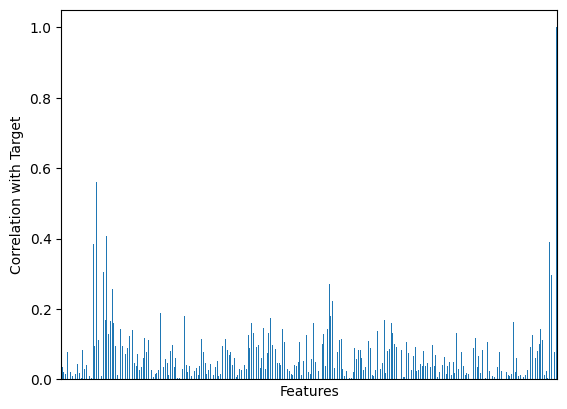

In [45]:
## Visualize the correlation
target_column = "Q29_Encoded"
correlation_with_target = df_cleaned_corr[target_column]
abs(correlation_with_target).plot.bar(xticks=[],ylabel='Correlation with Target', xlabel='Features')





*   We observce that not all feature columns have relatively strong correlations with our label column **Q29_encoded**. So, we will drop features having correlation with **Q29_encoded** under 0.1.





In [46]:
## drop features have correlation with target under 0.3

### Define the correlation threshold
correlation_threshold = 0.1
### select features
selected_columns = correlation_with_target[abs(correlation_with_target) > correlation_threshold].index


In [47]:
## dataset after selection
df_cleaned_feature_selected = df_cleaned[selected_columns]

In [48]:
## number of features selected
print(f"We selected {len(df_cleaned_feature_selected.columns)-1} features")

We selected 58 features


### 2.1.4 Visualizations/Plots of 58 Features and 1 Label

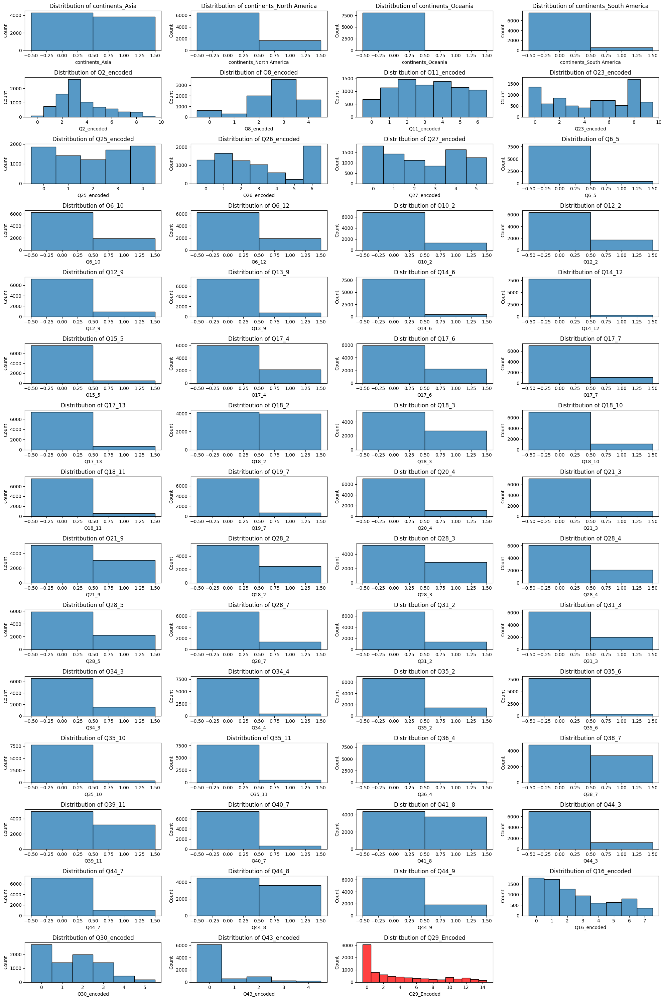

In [108]:
## distribution plots
plt.figure(figsize=(20, 30))
for i, col in enumerate(df_cleaned_feature_selected.columns):
  i = i+1
  if i == 59:
    plt.subplot(15,4,i)
    sns.histplot(df_cleaned_feature_selected[col], color='red', edgecolor='k', discrete=True)
  else:
    plt.subplot(15,4,i)
    sns.histplot(df_cleaned_feature_selected[col],edgecolor='k',discrete=True )
  plt.title('Distritbution of {}'.format(col))
plt.tight_layout()
plt.show()

*   Most distribution of features is skewed.
*   The scales of features are different.
*   There are significant more observations of label 0.
*   We can verify that our label is unbalanced.
*   We recognize some disparity in features scales.


In [50]:
## count plots
num_columns = 4

# Calculate the number of rows required based on the number of features
num_rows = (len(df_cleaned_feature_selected.columns[:-1]) + num_columns - 1) // num_columns

plt.figure(figsize=(30, 15 * num_rows))
gs = gridspec.GridSpec(num_rows, num_columns)

for i, feature in enumerate(df_cleaned_feature_selected.columns[:-1]):
    ax = plt.subplot(gs[i])
    sns.countplot(x=feature, hue='Q29_Encoded', data=df_cleaned_feature_selected)
    plt.title(f'Count plot of {feature} and Salary_Encoded')
    plt.legend(loc='best')

plt.tight_layout()
plt.show()



## 2.2 Benefits of Feature Engineering

Feature engineering is a technique to improve the performance of our Ordinary Logistic Regression model. In the previous cleaning section, we have already experienced two techniques in feature engineering on Catogirical features which are **One-Hot Encoding** and **Label Encoding**. With these two techniques, we can add more features to our model which may significantly increase the accuracy of our predictions. Moreover, we also applied **Binning** to **Q4** which represents the citizenships of the participants. By using **Binning**, we were able to decrease the complexity of our model by categorizing countries with continents.

## 2.3 Visualize the Importance of Features of Selected Features

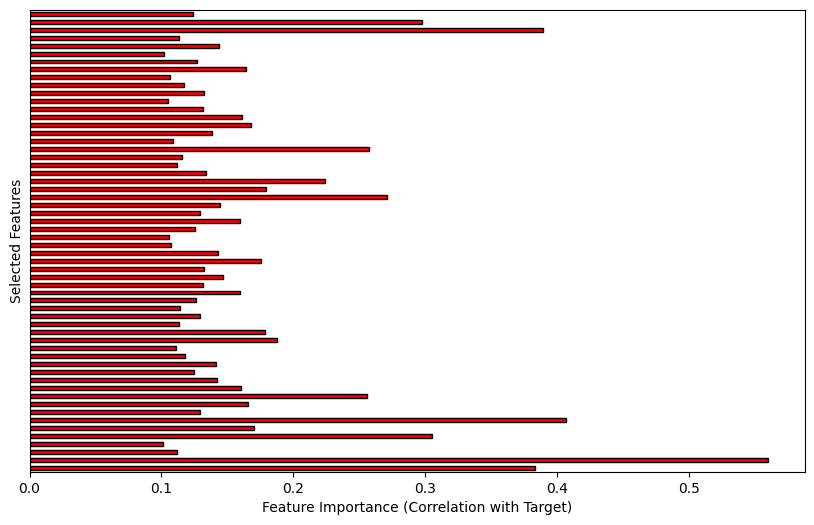

In [51]:
## Visualize the correlation after feature selection
target_column = "Q29_Encoded"
df_cleaned_feature_selected_corr = df_cleaned_feature_selected.corr()
correlation_with_target = df_cleaned_feature_selected_corr[target_column]
correlation_with_target = correlation_with_target.iloc[:-1] # drop the last element (correlation with target itself)

plt.figure(figsize=(10, 6))
correlation_with_target.abs().plot.barh(color='red',edgecolor='k')
plt.yticks([])
plt.ylabel('Selected Features')
plt.xlabel('Feature Importance (Correlation with Target)')

plt.show()

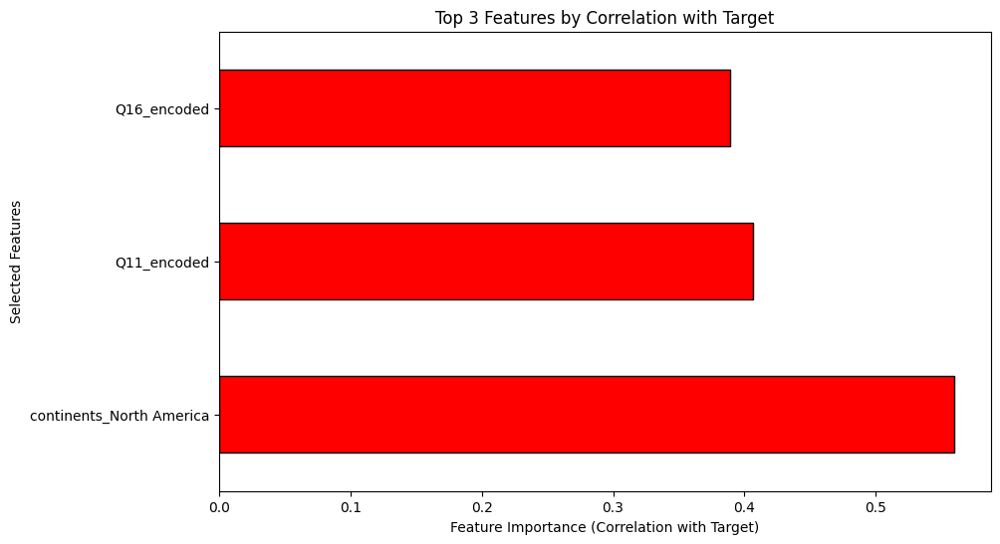

In [52]:
# Sort the correlation values with the target column in descending order
sorted_correlation = correlation_with_target.abs().sort_values(ascending=False)

# Select the top 3 features
top_3_features = sorted_correlation.index[:3]

# Plot the correlations
plt.figure(figsize=(10, 6))
correlation_with_target[top_3_features].abs().plot.barh(color='red', edgecolor='k')
plt.yticks(range(3), top_3_features)
plt.ylabel('Selected Features')
plt.xlabel('Feature Importance (Correlation with Target)')
plt.title('Top 3 Features by Correlation with Target')
plt.show()

# 3. Model Implementation

In this section, we will implement **ordinal logistic regression** algorithm on the *training data* using **10-fold cross-validation**.

## 3.1 Fit Model with Default Hyperparameters


### 3.1.1 Train-Test Split

We will use train-test ratio of 70/30.

In [53]:
## define features and label
features =  df_cleaned_feature_selected.drop(columns = 'Q29_Encoded')
label = df_cleaned_feature_selected['Q29_Encoded']

## train test split
X_train, X_test, y_train, y_test = train_test_split(features, label, test_size=0.3, random_state=100)

Check the Shape of Train and Test set

In [54]:
print(f'The shape of Feature train set is {X_train.shape}')
print(f'The shape of Label train set is {y_train.shape}')
print(f'The shape of Feature test set is {X_test.shape}')
print(f'The shape of Label test set is {y_test.shape}')

The shape of Feature train set is (5695, 58)
The shape of Label train set is (5695,)
The shape of Feature test set is (2441, 58)
The shape of Label test set is (2441,)


### 3.1.2 Rescaling values

From previous steps, we notice that our features columns have different scales. This issue can significantly impact on our model because features with greater scales would have a greater impact on the solution. Therefore, we can use scaler function to rescale our features.

In [55]:
## rescale
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### 3.1.3 Implement models and Make prediction

Our ordinary multi-class classification model is built upon binary logistic regression. The probabilities for each ordinal category relative to the baseline category. The probability of each ordinal category is represented by the difference in the probability of its baseline category to the previous baseline category. The mathematical expressions of our algorthm is shown below.

Suppose we have k ordinal labels:

\begin{align}
P(Y=0|x) &= P(Y = 0|x) \\
P(Y=i|x) &= P(Y \leq i|x)-P(Y\leq{i-1}|x), 1\leq{i}\leq{k-1}\\
P(Y=k|x) &= 1 - P(Y \leq{k-1}|x)
\end{align}

Every $P(Y\leq{j}|x), j∈[0,k]$ is calculated from binary logistic regression which catogorize all $i\leq{j}$ as the baseline category (0) and all others as 1.

In [56]:
import warnings
warnings.filterwarnings("ignore")

In [57]:
## build binay models
def binary_models(features, label):

  # Determine the unique categories in the ordinal variable
  unique_labels = np.unique(label)
  # Initialize a list to store the binary models
  binary_models = []

  for i in range(len(unique_labels)-1):
      # Create a binary target variable for the current transition
      y_binary = (label > i).astype(int)
      model = LogisticRegression()
      # Fit a binary logistic regression model
      model.fit(features, y_binary)
      binary_models.append(model)
  return binary_models

We build a function to calculate the probabilities from the binary model, update the probability of each ordinal category, and make prediction based on the index of the column with the highest probability of each sample.

In [58]:
## make predictions based on binary models
def predictions(X_test, binary_models):
    num_binary_models = len(binary_models)
    ## prepare a zero matrix to store our predictions on probablities
    shape = (len(X_test), num_binary_models + 1)
    raw_prediction = np.zeros(shape)

    prediction_here = None  # Initialize prediction_here

    for i in range(num_binary_models):
        ## probablities predicitons in current binary model
        prob = binary_models[i].predict_proba(X_test)

        if i == 0: ## for first baseline model
            raw_prediction[:, i] = prob[:, 0]
        elif i == num_binary_models - 1: ## for the last baseline model
            raw_prediction[:, i] = prob[:, 0] - prob_prv[:,0]
            raw_prediction[:, i+1] = prob[:, 1]
        else: ## baseline model in between
            raw_prediction[:, i] = prob[:, 0] - prob_prv[:,0]
        ## store the current probabilites for the next iteration
        prob_prv = prob
    predicted_ordinal = np.argmax(raw_prediction, axis=1)
    return predicted_ordinal, raw_prediction



In [59]:
## fit model and make prediction
models = binary_models(X_train, y_train)
predict, probabilities = predictions(X_train, models)

### 3.1.4 Present probabilities of belonging to each of the salary buckets

In [60]:
df = pd.DataFrame(probabilities)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.752542,0.071341,0.038352,0.038836,0.021674,0.026622,0.014349,0.014466,0.006524,0.005112,0.005081,0.001090,0.001473,-0.000872,0.003410
1,0.339095,0.142128,0.153666,0.130429,0.083561,0.022497,0.029307,0.024599,0.014494,0.004897,0.017921,0.008528,0.005815,-0.000469,0.023532
2,0.038344,0.018301,0.025694,0.016427,0.016613,0.031314,0.038633,0.001614,0.024908,0.000477,0.118393,0.162928,0.306071,0.172326,0.027956
3,0.829439,0.059146,0.041252,0.021788,0.005358,0.015316,0.008894,0.007632,0.003518,0.002562,0.001723,0.000840,0.001141,0.000143,0.001247
4,0.245695,0.034864,0.047804,0.075618,0.003887,0.093461,0.103589,0.101843,0.060926,0.080199,0.056018,0.045703,0.034302,0.007876,0.008215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5690,0.362624,0.138714,0.080942,0.068398,0.099156,0.081825,0.016775,0.053686,0.021066,0.014787,0.041269,0.005303,0.006464,0.001644,0.007346
5691,0.398152,0.040874,0.109049,0.114789,0.053896,0.100646,0.035621,0.065441,0.033586,0.013606,0.016957,0.006763,0.004585,0.002121,0.003913
5692,0.177515,0.124735,0.108145,0.084045,0.147553,0.080703,0.069394,0.004132,-0.002850,0.075122,0.075623,-0.019095,0.025067,0.034493,0.015418
5693,0.046896,0.017557,0.022180,0.049544,0.049503,0.033136,0.089552,0.122922,0.086577,0.091379,0.089203,0.126986,0.093862,0.066905,0.013797


In [61]:
## each row should sum up to 1
row_sums = df.sum(axis=1)
# Check if each row sums up to 1
row_sums_close_to_1 = np.allclose(row_sums, 1.0)

# Print the results
if row_sums_close_to_1:
    print("All rows sum up to 1.")
else:
    print("Not all rows sum up to 1.")

All rows sum up to 1.


### 3.1.5 Evaluation

First, we can check the accuracy of our prediction to see the performance of our model.


In [62]:
accuracy = accuracy_score(y_train, predict)
print(f"Accuracy: {accuracy}")

Accuracy: 0.4270412642669008


The accuracy of 0.43 represents that only 41% of predictions are the same as labels in our test set. We may conclude that our model is not as good as expected. But this conclusion is not strict. We will take further action.

## 3.2 Evluation with 10-fold Cross-Validation
The previous result may be caused by our choice of train data set. We can test this claim by using 10-fold cross-validation. By using 10-fold cross-validation, we evaluate our model more comprehensively.

In [63]:
## KFold split
n_splits = 10
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

In [64]:
## Initialize a list to store evaluation metric scores for each fold
evaluation_scores = []

In [65]:
## Iterate over each fold for cross-validation
for train_index, test_index in kf.split(X_train, y_train):
    X_train_cross_val, X_test_cross_val= features.iloc[train_index], features.iloc[test_index]
    y_train_cross_val, y_test_cross_val = label.iloc[train_index], label.iloc[test_index]
    ## rescale
    scaler = StandardScaler()

    X_train_cross_val = scaler.fit_transform(X_train_cross_val)
    X_test_cross_val = scaler.transform(X_test_cross_val)

    # Initialize and train your model
    models = binary_models(X_train_cross_val, y_train_cross_val)  # Replace with your specific model class

    # Make predictions on the test set
    y_pred, y_prob = predictions(X_test_cross_val, models)

    # Evaluate the model using the chosen evaluation metric
    accuracy = accuracy_score(y_test_cross_val, y_pred)
    evaluation_scores.append(accuracy)

In [66]:
## Calculate the mean and standard deviation of the evaluation scores across all folds
mean_score = np.mean(evaluation_scores)
variance = np.var(evaluation_scores)
print(f"Accuracy across folds: {evaluation_scores}")
print(f"Mean Score: {mean_score}")
print(f"Variance: {variance}")

Accuracy across folds: [0.38596491228070173, 0.39649122807017545, 0.41578947368421054, 0.39824561403508774, 0.41403508771929826, 0.37434094903339193, 0.4182776801405975, 0.36906854130052724, 0.40597539543058, 0.39015817223198596]
Mean Score: 0.39683470539265564
Variance: 0.0002640255854330964


The average accuracy across folds is around 0.4 which is close to our accuracy with a single train-test split. Therefore, the result accuracy is not dependent on our selection of a train-test split.

## 3.3 Implement Models after Modifying One Hyperparameter

In order to gain better performance of our model, we can test fit our model with other hyperparameters instead of using default values. The **LogisticRegression** we used for binary models has many hyperparameters available for modification. Here, we will modify **C** to check whether we can receive better performance. We will also verify whether this hyperparameter has a direct impact on the bias-variance trade-off.






We will try 9 different values of **C** and build 9 different models:


1.   Model 1: C = 0.001
2.   Model 2: C = 0.01
3.   Model 3: C = 0.05
4.   Model 4: C = 0.1
5.   Model 5: C = 0.5
6.   Model 6: C = 1
7.   Model 7: C = 5
8.   Model 8: C = 10
9.   Model 9: C = 100



### 3.3.1 Implementation

In [67]:
## build hyperparameter modified binay models
def binary_models_C(features, label, C):

  # Determine the unique categories in the ordinal variable
  unique_labels = np.unique(label)
  # Initialize a list to store the binary models
  binary_models = []

  for i in range(len(unique_labels)-1):
      # Create a binary target variable for the current transition
      y_binary = (label > i).astype(int)
      model = LogisticRegression(C=C)
      # Fit a binary logistic regression model
      model.fit(features, y_binary)
      binary_models.append(model)
  return binary_models




In [68]:
### build 9 models
def modified_binary_models(features, label, C_list):
  modified_binary_models = []
  for i in range(len(C_list)):
    modified_binary_models.append(binary_models_C(features,label, C=C_list[i]))
  return modified_binary_models

C_list = [0.001,0.01,0.05,0.1,0.5,1,5,10, 100]
modified_binary_models = modified_binary_models(X_train, y_train, C_list)

### 3.3.2 Make Prediction and Evaluate the result

In [69]:
## make prediction and evaluate for 10 models
variance_list  = []
squared_bias_list = []
evaluation_scores = []
mse_list = []
for modified_binary_model in modified_binary_models:
    # Make predictions on the test set
    y_pred, y_prob = predictions(X_test, modified_binary_model)

    # caluclate bias and variance
    squared_bias = np.mean((np.mean(y_pred) - y_test) ** 2)
    variance = np.mean((y_pred - np.mean(y_test)) ** 2)
    mse = np.mean((y_pred - y_test) ** 2)
    variance_list.append(variance)
    squared_bias_list.append(squared_bias)
    mse_list.append(mse)


    # Evaluate the model using the chosen evaluation metric
    accuracy = accuracy_score(y_test, y_pred)
    evaluation_scores.append(accuracy)

### 3.3.3 Visualize the Evaluation and Model Selection

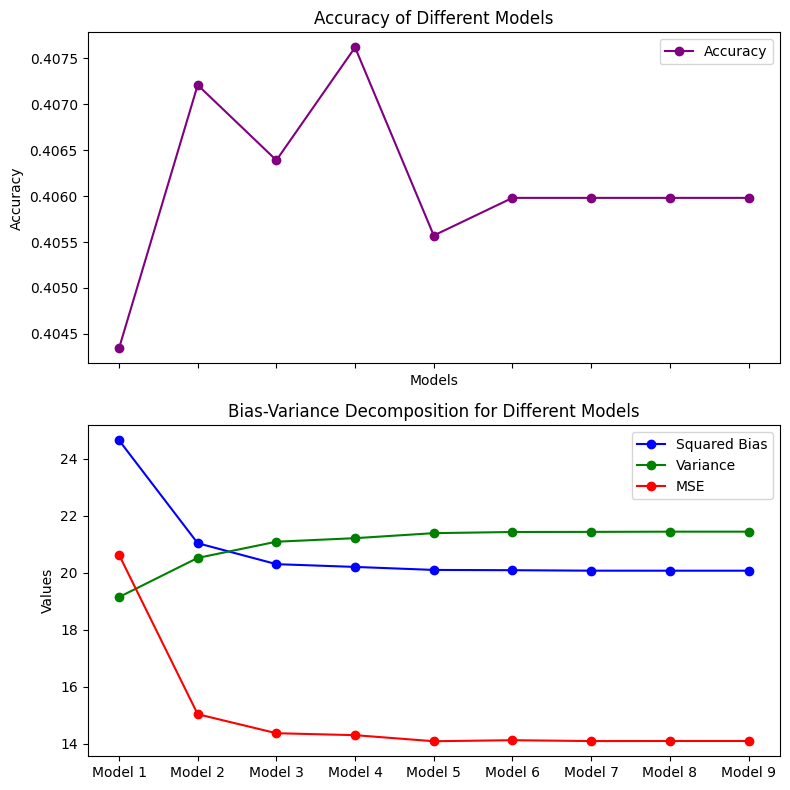

In [70]:
# Create x-values for the data points
x_values = np.arange(len(squared_bias_list))

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(8, 8))


# Plot the evaluation scores in the first subplot
ax1.plot(x_values, evaluation_scores, marker='o', color='purple', label='Accuracy')
ax1.set_xlabel('Models')
ax1.set_ylabel('Accuracy')
ax1.set_title('Accuracy of Different Models')
ax1.legend()

# Plot the bias-variance decomposition in the second subplot
ax2.plot(x_values, squared_bias_list, marker='o', label='Squared Bias', color='blue')
ax2.plot(x_values, variance_list, marker='o', label='Variance', color='green')
ax2.plot(x_values, mse_list, marker='o', label='MSE', color='red')
ax2.set_ylabel('Values')
ax2.set_title('Bias-Variance Decomposition for Different Models')
ax2.legend()

# Set x-axis labels
ax1.set_xticks(x_values)
ax1.set_xticklabels(['Model 1', 'Model 2', 'Model 3', 'Model 4', 'Model 5','Model 6','Model 7','Model 8','Model 9'])

# Adjust spacing
plt.tight_layout()

# Show the plot
plt.show()




*   We successfully identify trade-offs between MSE and Variance. MSE decreases from **Model 1** to **Model 2** while variance increases. Also, the trend remains the same when **C** is increasing.
*   From this perspective, **Model 3** is the best model.



## 3.4 Present the Probablities Output of the Best Model with one hyperparameter Modification.

In [86]:
## Implement Model 2
model_3 = binary_models_C(X_train, y_train, 0.05)
model_3_pred, model_3_prob = predictions(X_train, model_3)

In [87]:
# Define column names
columns = ['Salary_bucket_0',
      'Salary_bucket_1',
      'Salary_bucket_2',
      'Salary_bucket_3',
      'Salary_bucket_4',
      'Salary_bucket_5',
      'Salary_bucket_6',
      'Salary_bucket_7',
      'Salary_bucket_8',
      'Salary_bucket_9',
      'Salary_bucket_10',
      'Salary_bucket_11',
      'Salary_bucket_12',
      'Salary_bucket_13',
      'Salary_bucket_14',]

# Create a DataFrame
probablities_pred = pd.DataFrame(model_3_prob, columns=columns)

In [88]:
# estimated probabilities from model 2
probablities_pred

,Salary_bucket_0,Salary_bucket_1,Salary_bucket_2,Salary_bucket_3,Salary_bucket_4,Salary_bucket_5,Salary_bucket_6,Salary_bucket_7,Salary_bucket_8,Salary_bucket_9,Salary_bucket_10,Salary_bucket_11,Salary_bucket_12,Salary_bucket_13,Salary_bucket_14
0,0.749794,0.071915,0.039022,0.038906,0.021508,0.026448,0.014578,0.014433,0.006535,0.005374,0.005177,0.001286,0.001634,-0.001178,0.004569
1,0.347317,0.141766,0.150533,0.127308,0.080780,0.023456,0.029426,0.024343,0.014878,0.005730,0.018452,0.008806,0.005598,0.002411,0.019195
2,0.040687,0.018850,0.026333,0.016829,0.017750,0.032794,0.039789,0.004416,0.027468,0.003808,0.128760,0.161493,0.295837,0.157620,0.027566
3,0.825661,0.060019,0.041569,0.022311,0.005707,0.015581,0.009164,0.007831,0.003639,0.002707,0.001923,0.000985,0.001129,-0.000028,0.001801
4,0.253460,0.035623,0.047600,0.074885,0.006007,0.091963,0.100975,0.098841,0.058251,0.076981,0.055557,0.046805,0.034473,0.008381,0.010198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5690,0.360974,0.138429,0.081778,0.068789,0.097286,0.080945,0.017425,0.052422,0.020656,0.015123,0.041352,0.005980,0.007341,0.002116,0.009384
5691,0.396996,0.043192,0.108303,0.112944,0.053600,0.098326,0.035905,0.064160,0.033839,0.014119,0.017447,0.007683,0.005629,0.002348,0.005510
5692,0.182339,0.126397,0.109286,0.085252,0.144174,0.079991,0.067531,0.005590,0.000548,0.069777,0.073084,-0.015563,0.023395,0.031784,0.016417
5693,0.049436,0.018289,0.023169,0.049990,0.050417,0.034100,0.088783,0.120168,0.084018,0.087390,0.092218,0.122866,0.095305,0.067699,0.016153


# 4. Model Tuning

In this section, we will use **Grid Searching** which is a well know method for selecting hyperparameters to optimize our model.




## 4.1 Identify and select Hyperparameters for Tuning

Since our binary classifications in OLR used **LogisticRegression** from **sklearn**, we can tune our model by modifying hyperparameters available in **LogisticRegression**. According to **sklearn**, the available hyperparameters are list below:

1.   **penalty**
2.   **dual**
3.   **tol**
4.   **fit_intercept**
5.   **intercept_scaling**
6.   **class_weight**
7.   **random_state**
8.   **solver**
9.   **max_iter**
10.   **multi_class**
11.   **verbose**
12.   **warm_start**
13.   **n_jobs**
14.   **l1_ratio**

In our case, we will modify **C** and **Penalty** to tune our model. However, we also notice that not all penalties are supported by the default **solver = 'lbfgs'**. Therefore, we will also modify **solver** which allows us to test more models. The reasons for choosing these two parameters are explained as follows:



*   **C**: **C** controls the trade-off between fitting the training data and preventing overfitting. Our model's performance on prediction will be significantly impacted by either overfitting or underfitting. Therefore, **C** should be modified to improve performance.
*   **Penalty**: We have two different options in **Penalty**. The first one is **l1: L1 Regularization (Lasso)**. L1 regularization considers features with non-zero coefficients as important features. The remaining unimportant features will automatically be set to zero. By that, it can lead to a simpler model and prevent overfitting. In contrast, **l2: L2 Regularization (Ridge)** strictly considers every feature we put in the model.





## 4.2 Performance Measures Selection

There are many different types of success matrics we can use to evaluate the performance of our model.Commonly used success matrics used for Classification include:


*   **Accuracy**: refers to the total number of correct predictions over the total number of predictions.
*   **Precision**: refers to the total number of true positive predictions over the total number of datapoints
predicted as positive.
*   **Recall or Sensitivity**: refers to the total number true positive predictions over total the number of all
datapoints with actual positive labels.
*   **Specificity**: refers to the total number of true negative predictions over the total number of all datapoints
with actual negative labels.
*   **F1-score**: refers to the harmonic mean of precision and recall.


 In the previous section, we used **Accuracy** as our performance measure which is a common metric. It is the ratio of correctly predicted instances to the total instances. However, this might not be a good measure to show performance. Because it can be misleading when dealing with imbalanced datasets. For example, my samples contain 98 "Normal" labels and 2 "Attack" labels, my model is unreliable in detecting "Attack" because my model has 98% while two "Attack" samples are predicted as "Normal".  It is crucial because we observed that our label **Q29_Encoded** is so unbalanced that most observations have the label of 0.


 Therefore, a better performance measure in our case is **F1_Score**. More specifically, we used **Macro-Averaged F1-Score** because we have multiple labels in our data set. The **Macro-Averaged F1-Score** calculates the F1-score for each class individually and then takes the unweighted average of those class-specific F1-scores. It is helpful to identify whether our model can make the same quality of prediction across different labels.

 In conclusion, our **Grid-Searching** will take **Macro-Averaged F1-Score** to evaluate the best model. Additionally, we will also check **Micro-Averaged F1 Score** to verify whether our model is significantly affected by unbalance.

### 4.2.1 Macro-Averaged F1-Score of the Best Model from previous Section

In [96]:

f1_best_previous = f1_score(y_train, model_3_pred, average='macro')
print("Macro-Averaged F1-Score of the Best Model from previous Section:",f1_best_previous)

Macro-Averaged F1-Score of the Best Model from previous Section: 0.17512667661021


## 4.3 Grid Searching



In [74]:
## build hyperparameter modified binay models
def binary_models_tune(features, label, C, penalty, solver):

  # Determine the unique categories in the ordinal variable
  unique_labels = np.unique(label)
  # Initialize a list to store the binary models
  binary_models = []

  for i in range(len(unique_labels)-1):
      # Create a binary target variable for the current transition
      y_binary = (label > i).astype(int)
      model = LogisticRegression(C=C, penalty = penalty, solver=solver)
      # Fit a binary logistic regression model
      model.fit(features, y_binary)
      binary_models.append(model)
  return binary_models

In [109]:
## grid search
scaler = StandardScaler()
kfold = KFold(n_splits=10)
kfold.get_n_splits(features)

best_model = model_3
best_params = {}
best_f1 = 0

for C in [0.001,0.01,0.05,0.1,0.5,1,5,10,100]:
  for penalty in ['l1', 'l2']:
    for solver in ['newton-cg','lbfgs','liblinear','sag']:
      f1_scores = []
      micro_f1 = []
      evaluation_scores = []
      np_idx = 0
      try:
        for train_idx, test_idx in kfold.split(X_train):
            X_train_tune, X_test_tune = features.values[train_idx], features.values[test_idx]
            y_train_tune, y_test_tune = label.values[train_idx], label.values[test_idx]
            X_train_tune = scaler.fit_transform(X_train_tune)
            X_test_tune = scaler.transform(X_test_tune)
            binary_models = binary_models_tune(X_train_tune, y_train_tune, C, penalty, solver)
            pred, prob = predictions(X_test_tune, binary_models)
            f1 = f1_score(y_test_tune, pred, average='macro')
            f1_scores.append(f1)
            micro_f1.append(f1_score(y_test_tune, pred, average='micro'))
            accuracy = accuracy_score(y_test, y_pred)
            evaluation_scores.append(accuracy)
            np_idx += 1
        if np.mean(f1_scores) > best_f1:
          best_model = binary_models
          best_params = {'C':C, 'penalty':penalty, 'solver': solver}
          best_f1 = np.mean(f1_scores)
          avg_micro_f1 = np.mean(micro_f1)
          mean_score = np.mean(evaluation_scores)
      except ValueError:
        continue

print("Best hyperparameters:", best_params)
print("Best Macro-Averaged F1-score:", best_f1)
print("Micro-Averaged F1-score of the Best Model:", avg_micro_f1)
print("Average Accuracy of the Best Model:", mean_score)





Best hyperparameters: {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
Best Macro-Averaged F1-score: 0.12879665400733303
Micro-Averaged F1-score of the Best Model: 0.3970119939567724
Average Accuracy of the Best Model: 0.40598115526423595



*   After **Grid Searching**, we find the best hyperparameters among the given choices.
*   The best hyperparameters are: **'C': 1, 'penalty': 'l2', 'solver': 'liblinear'**.
*   But the **Macro-Averaged F1-score (Around 0.13)** indicates that there is substantial variation in the model's performance across different labels. Because **Micro-Averaged F1 Score (Around 0.4)** is higher suggesting that the model performs better with some labels than others.



We will train our best model by training set so that we can compare its performance with the best model in section 3.

In [99]:
### store the best model
best_tuned_model = binary_models_tune(X_train, y_train, 1, 'l2', 'liblinear')

In [100]:
prediction_best, prob_best = predictions(X_train, best_tuned_model)
f1_best = f1_score(y_train, prediction_best, average='macro')
print("Macro-Averaged F1-Score of the Best Tuned Model:",f1_best)

Macro-Averaged F1-Score of the Best Tuned Model: 0.18277086101311824




*   The Macro-Averaged F1-Score of the Best Tuned Model is 0.183 which is higher than the best model from the previous section (0.175). Although the gap is small, we can still see some improvement from model tuning.



## 4.4 Plot Feature Importance and compare with Section 2

In contrast with section 2, we use the absolute value of the normalized value of feature coefficients to refect the feature importance. We will plot the feature importance for each binary classifier in our OLR.

In [101]:
## Get coefficients from the best model
coefficients_list = []
for model in best_tuned_model:
  coe_model = model.coef_
  coefficients_list.append(coe_model)


In [102]:
## normalize coefficents to show the absolute value to show importance
normalized_coefficients_list = []
for coefficients  in coefficients_list:
    normalized_coefficients = abs((coefficients) / coefficients.sum())
    normalized_coefficients_list.append(normalized_coefficients)

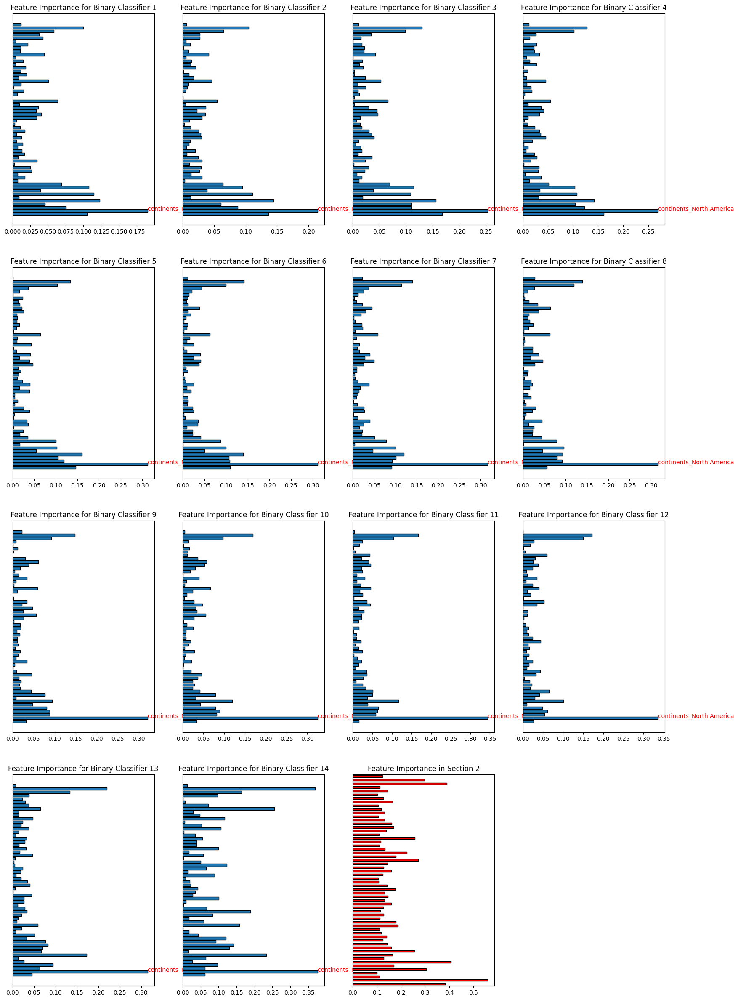

In [103]:
# Create a bar plot for each array in the list
feature_names = features.columns.tolist()
plt.figure(figsize=(20, 30))
for i, normalized_coefficients in enumerate(normalized_coefficients_list):
    i = i+1
    plt.subplot(4,4,i)
    max_index = np.argmax(normalized_coefficients[0])
    plt.barh(feature_names, normalized_coefficients[0], edgecolor='k')
    plt.text(normalized_coefficients[0][max_index], max_index, f'{feature_names[max_index]}', color='r')
    plt.title(f"Feature Importance for Binary Classifier {i}")
    plt.yticks([])
# feature importance of section 2
plt.subplot(4,4,i+1)
correlation_with_target.abs().plot.barh(color='red',edgecolor='k')
plt.yticks([])
plt.title(f"Feature Importance in Section 2")

plt.show()



*   Although there are some variations, we notice that the distribution of feature importance in every classfier is similar to the feature importance in section 2.
*   In the majority of binary classifiers, **continents_North America** is the most determining in model predictions. Only in binary classifier 14, **Q30_encoded** has the same importance as **continents_North Amarica**.



# 5. Testing & Discussion

In previous analyses, we have chosen the best model. In this section, we will use this model to make predictions on our test set. We will also compare the performance of our model on the test set with the performance on the training set. In the end, we will discuss how we can improve our prediction.

## 5.1 Make Classifications on the Test Set using the Best Model


In [104]:
## prediction with the best model
test_pred, test_prob  = predictions(X_test, best_tuned_model)
# Define column names
columns = ['Salary_bucket_0',
      'Salary_bucket_1',
      'Salary_bucket_2',
      'Salary_bucket_3',
      'Salary_bucket_4',
      'Salary_bucket_5',
      'Salary_bucket_6',
      'Salary_bucket_7',
      'Salary_bucket_8',
      'Salary_bucket_9',
      'Salary_bucket_10',
      'Salary_bucket_11',
      'Salary_bucket_12',
      'Salary_bucket_13',
      'Salary_bucket_14',]

# Create a DataFrame
test_prob_df = pd.DataFrame(test_prob, columns=columns)
test_pred_df = pd.DataFrame(test_pred, columns=['Predicted Label'])
y_test_df = pd.DataFrame(y_test)
y_test_df.reset_index(drop=True, inplace=True)

# add label to the dataframe
result = pd.concat([y_test_df,test_pred_df,test_prob_df], axis = 1)

In [105]:
result.rename(columns={'Q29_Encoded': 'True Label'}, inplace=True)
result

,True Label,Predicted Label,Salary_bucket_0,Salary_bucket_1,Salary_bucket_2,Salary_bucket_3,Salary_bucket_4,Salary_bucket_5,Salary_bucket_6,Salary_bucket_7,Salary_bucket_8,Salary_bucket_9,Salary_bucket_10,Salary_bucket_11,Salary_bucket_12,Salary_bucket_13,Salary_bucket_14
0,3,0,0.304603,0.093777,0.115842,0.153796,0.106324,0.083778,0.028293,0.057149,0.028882,0.007993,0.009939,0.002652,0.000697,0.004367,0.001908
1,7,10,0.071676,0.032995,0.040510,0.028796,0.044524,0.048467,0.075986,-0.018184,0.006739,0.025797,0.268739,0.155505,0.097300,0.061059,0.060091
2,4,0,0.328349,0.082719,0.144116,0.069214,0.136862,0.044692,0.056453,0.046779,0.033023,0.003138,0.032325,0.010608,0.005857,0.002886,0.002978
3,0,0,0.299978,0.184340,0.169893,0.141434,-0.026494,0.060365,0.017404,0.028686,0.005640,0.031097,-0.013228,0.043560,-0.006237,-0.024858,0.088420
4,5,6,0.096045,0.038082,0.046034,0.111930,0.104415,0.082870,0.125687,0.109551,0.090574,0.051834,0.071603,0.019009,0.024701,0.021203,0.006463
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2436,0,0,0.707109,0.117741,0.066432,0.031918,0.025730,0.012744,0.009451,0.008798,0.006978,0.001234,0.004821,0.002861,0.001866,0.000734,0.001582
2437,0,0,0.704977,0.127244,0.059901,0.034930,0.024601,0.013275,0.008151,0.008239,0.001626,0.002014,0.003536,0.003772,0.002534,0.002079,0.003122
2438,0,0,0.863984,0.059610,0.025524,0.014624,0.008533,0.010873,0.004564,0.004203,0.002138,0.000765,0.001134,0.001369,-0.000536,0.001206,0.002009
2439,10,0,0.366590,0.162627,0.088325,0.120714,0.014154,0.062083,0.029430,-0.031711,0.024628,0.054543,0.047384,0.016053,0.024214,0.008518,0.012449


## 5.2 Model Performance (Test vs Training)

### 5.2.1 Confusion Matrix of Test and Training

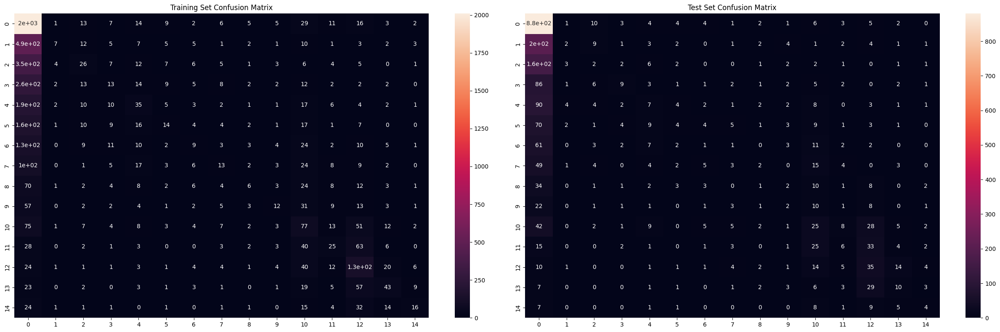

In [106]:
# concfusion matrix
labels = [i for i in range(15)]
train_pred, train_prob  = predictions(X_train, best_tuned_model)

CM_train = confusion_matrix(y_train, train_pred, labels=labels)
CM_test = confusion_matrix(y_test, test_pred, labels=labels)

plt.figure(figsize=(25,8))
plt.subplot(1,2,1)
sns.heatmap(CM_train,annot=True)
plt.title('Training Set Confusion Matrix')

plt.subplot(1,2,2)
sns.heatmap(CM_test,annot=True)
plt.title('Test Set Confusion Matrix')

plt.tight_layout()
plt.show()




*   As we can see from the confusion matrixes of training and test sets, our model does poorly on both sets. Our model is underfitting because the performances on both sets are unsatisfactory that not many labels are predicted correctly (referring to values on the diagonal of the confusion matrixs).



*   Many reasons can cause this problem. It could be that our data set is inbalanced as we have discussed in previous sections. We can fix this by adding more observations with more diverse labels.



*   Even, though we have selected significant features to fit our model, these features fail to identify the differences between labels. We can add more features to avoid this issue. Or, our feature selection method is not suitable for this task if we delete some determining features when using correlation.





*   From another perspective, it is possible that the ordinal logistic regression is not suitable for this classification problem. We can compare the performance of our model with models with other algorithms.






### 5.2.2 Visualize the Distribution of the True Label and their Prediction on both sets

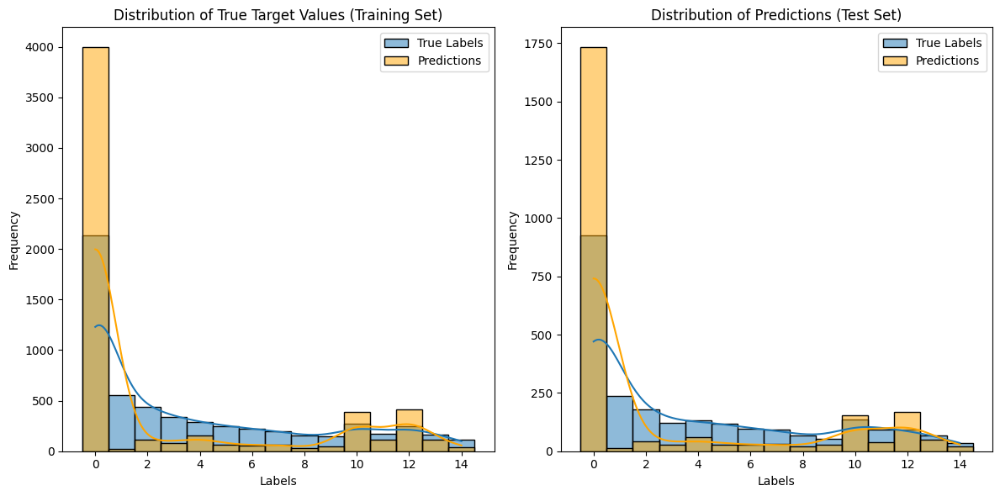

In [107]:
plt.figure(figsize=(12, 6))

# Distribution of the Training Set
plt.subplot(1, 2, 1)
plt.title("Distribution of True Target Values (Training Set)")
sns.histplot(y_train, kde=True, label='True Labels', discrete=True)
sns.histplot(train_pred, color='orange', kde=True, label='Predictions', discrete=True)
plt.xlabel("Labels")
plt.ylabel("Frequency")
plt.legend()

# Distribution of the Test Set
plt.subplot(1, 2, 2)
plt.title("Distribution of Predictions (Test Set)")
sns.histplot(y_test, kde=True, label='True Labels', discrete=True)
sns.histplot(test_pred, color='orange', kde=True, label='Predictions', discrete=True)
plt.xlabel("Labels")
plt.ylabel("Frequency")
plt.legend()

plt.tight_layout()
plt.show()



*   The visualiztions further prove our auguments in 5.2.1.

*   Many test observations are predicted to have label 0.

*   The unbalance harms our OLR model performance.









## 5.3 Insights from the Dataset and Model


We have successfully constructed our ordinal logistic regression model by creating individual binary classifiers that are based on the baseline labels. Each binary classifier is specifically trained to distinguish the baseline labels from all other labels, and the size of the baseline label set increases incrementally as we move from one model to the next. After training these binary classifiers, we utilize them to compute the probabilities associated with each label. Our predictions are then made based on the label with the highest probability. This methodology allows us to effectively model and predict ordinal data within the framework of binary classification.

We have also ensured that the accuracy of our model is not influenced by the choice of the training set, as the mean accuracy from cross-validation remains consistent with the accuracy of our originally trained model. To improve the model's performance, we have fine-tuned two key parameters using Grid Search. Additionally, we have opted to use the F-1 score as the performance metric, as our label set is imbalanced, as observed during exploratory data analysis (EDA), making accuracy an unsuitable choice.

Unfortunately, the final trained model still exhibits underfitting. This can be attributed to the imbalanced dataset, limited feature set, and the possibility of an incorrect algorithm selection. Ultimately, this experience has reinforced the importance of following well-defined procedures, both before (data cleaning, EDA) and after (evaluation, tuning, reflection) applying machine learning algorithms to classification tasks.